In [1]:
import os
import scanpy as sc
import numpy as np
data_dir = r'U:\Scientific Data\RG-AS04-Data01\Yinan\sc_data'
sc_dir = data_dir + os.sep + 'multiomics'
res_dir = data_dir + os.sep + 'Multiome_Mapping_Result'

In [2]:
rna_adata= sc.read_h5ad(sc_dir + os.sep + 'rna_adata.h5ad')

In [3]:
stage_ids_spatial = ['A_50p', 'B_75p', 'C_6s']
stage_ids_rna = ['5-50epi', '7-75epi', '9-6somite']
eids = ['E1', 'E2']

A_50p_E1
A_50p_E2
B_75p_E1
B_75p_E2
C_6s_E1


INFO:root:494 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:494 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 494 genes and uniform density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.579, KL reg: 0.000
Score: 0.870, KL reg: 0.001
Score: 0.887, KL reg: 0.000
Score: 0.892, KL reg: 0.000
Score: 0.895, KL reg: 0.000
Score: 0.897, KL reg: 0.000
Score: 0.898, KL reg: 0.000
Score: 0.898, KL reg: 0.000
Score: 0.899, KL reg: 0.000
Score: 0.900, KL reg: 0.000


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


C_6s_E2


INFO:root:494 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:494 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 494 genes and uniform density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.581, KL reg: 0.000
Score: 0.867, KL reg: 0.001
Score: 0.885, KL reg: 0.000
Score: 0.891, KL reg: 0.000
Score: 0.894, KL reg: 0.000
Score: 0.896, KL reg: 0.000
Score: 0.897, KL reg: 0.000
Score: 0.898, KL reg: 0.000
Score: 0.899, KL reg: 0.000
Score: 0.899, KL reg: 0.000


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


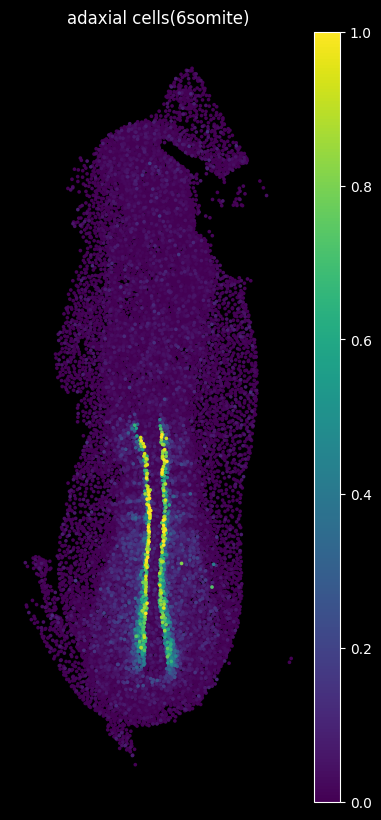

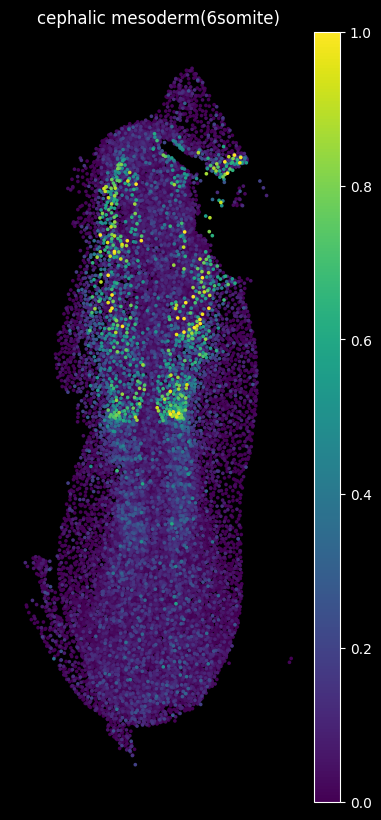

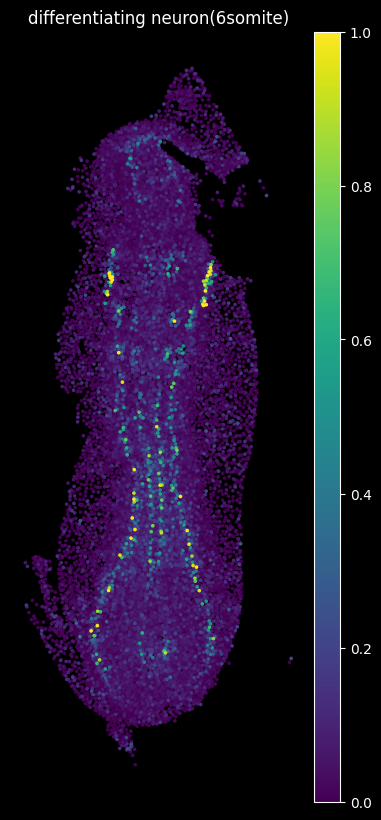

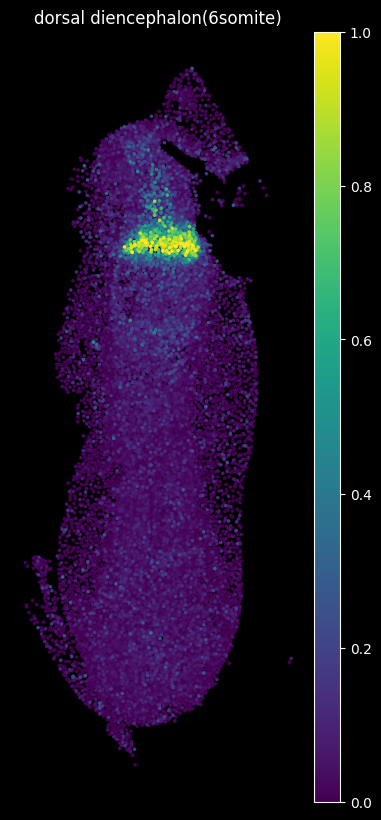

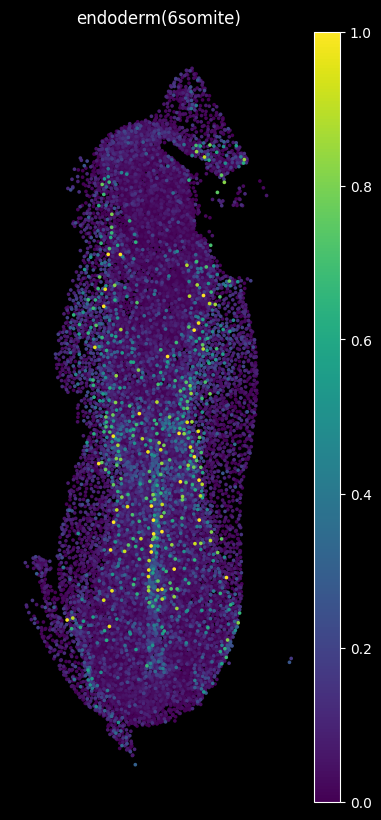

...

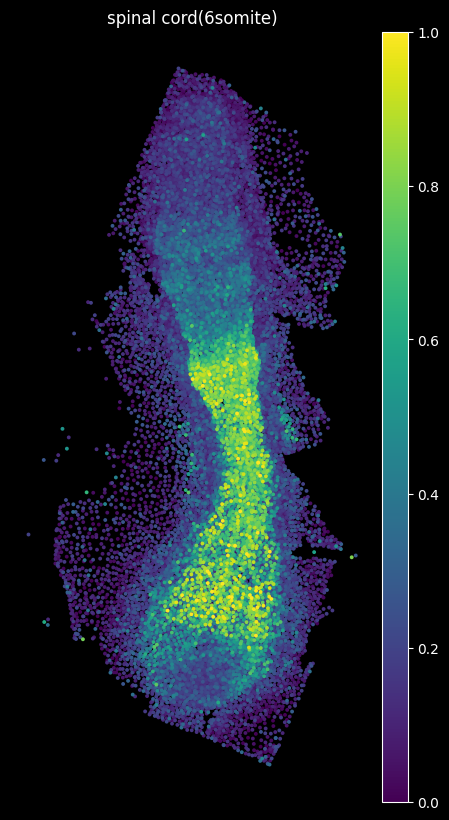

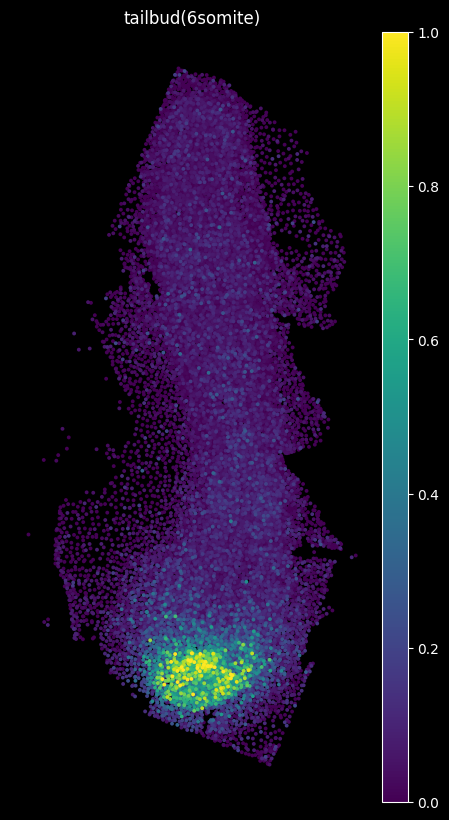

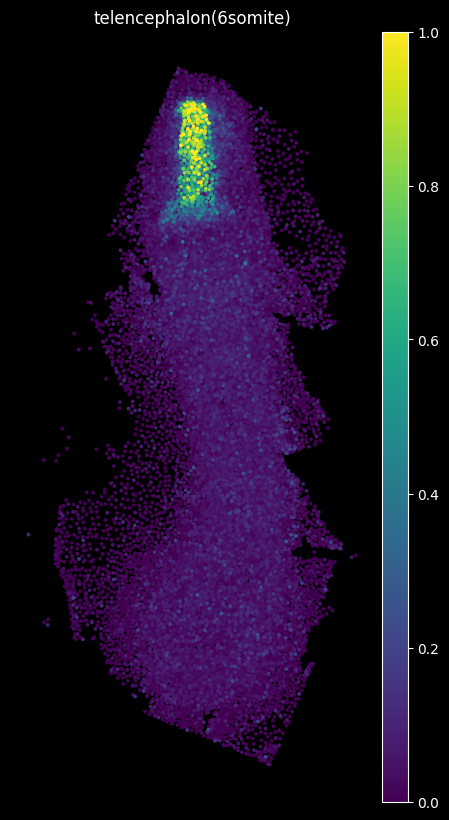

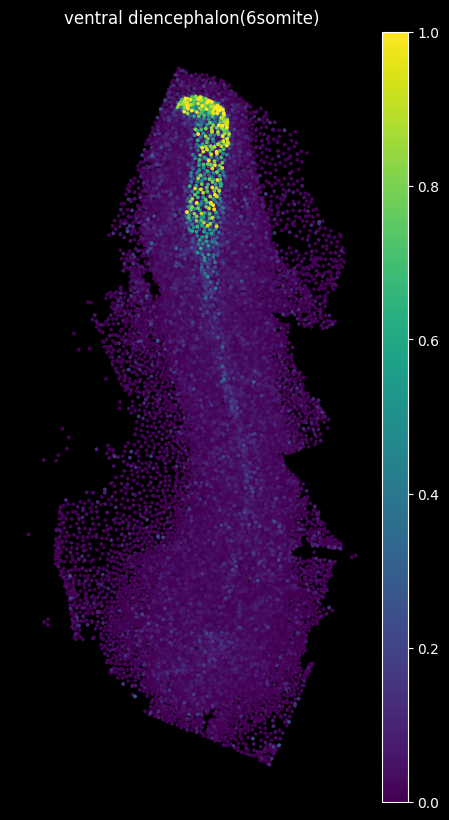

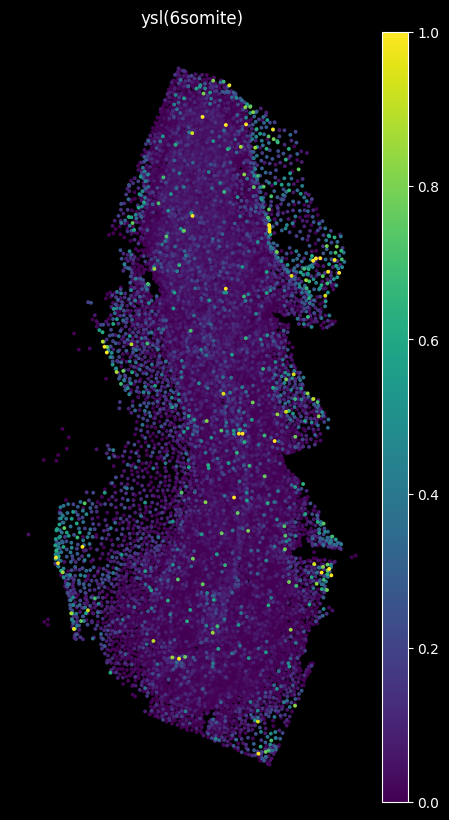

In [4]:
import tangram as tg
import matplotlib.pyplot as plt
for stage_id_spatial, stage_id_rna in zip(stage_ids_spatial, stage_ids_rna):

    spatial_adata = sc.read_h5ad(data_dir + os.sep + stage_id_spatial + '_scdata_all.h5ad')
    spatial_adata.X = spatial_adata.obsm['X_raw'].copy()

    for eid in eids:
        print(stage_id_spatial + '_' +  eid)
        if os.path.exists(res_dir + os.sep + stage_id_spatial + '_imputated_ref_' + eid + '.h5ad'):
            continue
        spatial_adata_use = spatial_adata[spatial_adata.obs['batch'] == eid].copy()
        rna_adata_use = rna_adata[rna_adata.obs['orig.ident2']==stage_id_rna].copy()

        device = "cpu"
        tg.pp_adatas(rna_adata_use, spatial_adata_use, genes=list(set(rna_adata_use.var_names) & set(spatial_adata_use.var_names)), gene_to_lowercase = False)
        gnames = rna_adata_use.var_names
        ad_map = tg.map_cells_to_space(rna_adata_use, spatial_adata_use, mode="cells", density_prior="uniform", device=device)  
        
        sc.write(res_dir + os.sep + stage_id_spatial + '_map_ref_' + eid + '.h5ad', ad_map)
        
        ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=rna_adata_use)
        ad_ge.var_names = gnames
        sc.write(res_dir + os.sep + stage_id_spatial + '_imputated_ref_' + eid + '.h5ad', ad_ge)

        tg.project_cell_annotations(ad_map, spatial_adata_use, annotation="cell_state")

        fig_dir = res_dir + os.sep + 'clusters_ref_' + eid
        plt.style.use('dark_background')
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        for c in rna_adata_use.obs["cell_state"].cat.categories:
            fig, ax = plt.subplots(figsize=(10, 10))
            tg.plot_cell_annotation_sc(spatial_adata_use, [c], perc=0.001, spot_size=10, ax=ax)
            fl_nm = fig_dir + os.sep + stage_id_spatial + '_' + c.replace('/', '_')
            fig.savefig(fl_nm)

* Integrate raw and imputed data

In [5]:
for stage_id_spatial in stage_ids_spatial:
    spatial_adata = sc.read_h5ad(data_dir + os.sep + stage_id_spatial + '_scdata_all.h5ad')
    spatial_adata.X = spatial_adata.obsm['X_raw'].copy()
    for eid in eids:
        print('Combining ' + stage_id_spatial + '_' + eid)
        if os.path.exists(res_dir + os.sep + stage_id_spatial + '_' + eid + '_with_imputation.h5ad'):
            continue
        spatial_adata_use = spatial_adata[spatial_adata.obs['batch'] == eid].copy()
        ad_ge = sc.read_h5ad(res_dir + os.sep + stage_id_spatial + '_imputated_ref_' + eid + '.h5ad')
        spatial_adata_use.obsm['X_imputed'] = ad_ge.X.copy()
        spatial_adata_use.uns['imputed_gene_names'] = np.array(ad_ge.var_names).astype(str)

        sc.write(res_dir + os.sep + stage_id_spatial + '_' + eid + '_with_imputation.h5ad', spatial_adata_use)

Combining A_50p_E1
Combining A_50p_E2
Combining B_75p_E1
Combining B_75p_E2
Combining C_6s_E1
Combining C_6s_E2


In [6]:
scdata = sc.read_h5ad(res_dir + os.sep + 'C_6s_E1_with_imputation.h5ad')

In [7]:
scdata_imputed = sc.AnnData(scdata.obsm['X_imputed'])
scdata_imputed.var_names = scdata.uns['imputed_gene_names']
scdata_imputed.obs_names = scdata.obs_names
scdata_imputed.obs = scdata.obs
scdata_imputed.obsm = scdata.obsm
scdata_imputed.obsp = scdata.obsp
scdata_imputed.uns = scdata.uns

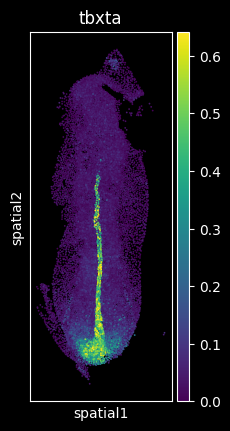

In [8]:
sc.pl.spatial(scdata_imputed, color='tbxta', spot_size=10, vmin=0, vmax='p99.9')

In [ ]:
ad_ge = sc.read_h5ad(res_dir + os.sep + stage_id_spatial + '_imputated_ref_' + eid + '.h5ad')

In [27]:
ad_ge.obsm['spatial'] = spatial_adata_use.obsm['spatial'].copy()

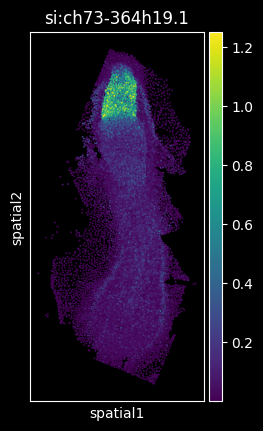

In [28]:
sc.pl.spatial(ad_ge, color='si:ch73-364h19.1', spot_size=10)

In [ ]:
sc.pl.spatial(ad_ge, color='gsc', spot_size=80, basis='global_sphere')

In [ ]:
rna_adata_use = rna_adata[rna_adata.obs['orig.ident2']=='9-6somite'].copy()